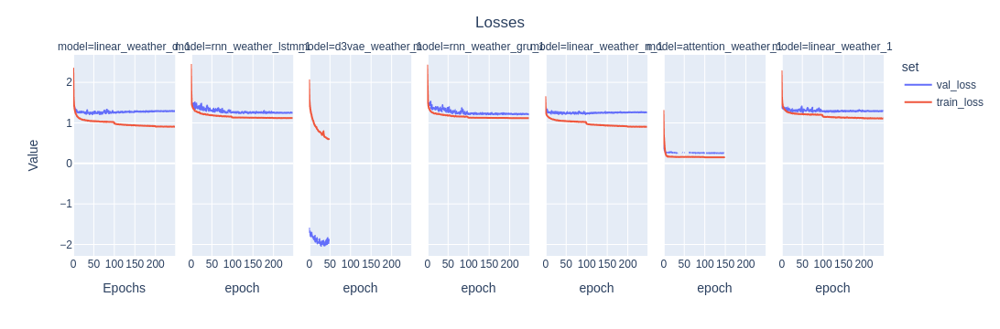

In [2]:
import plotly.express as px
import pandas as pd
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/csv/prova_test_LOSSES.csv')

fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model')
#fig_losses.update_traces(mode="markers+lines", hovertemplate=None)
#fig_losses.update_layout(hovermode="x unified")
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses.show()

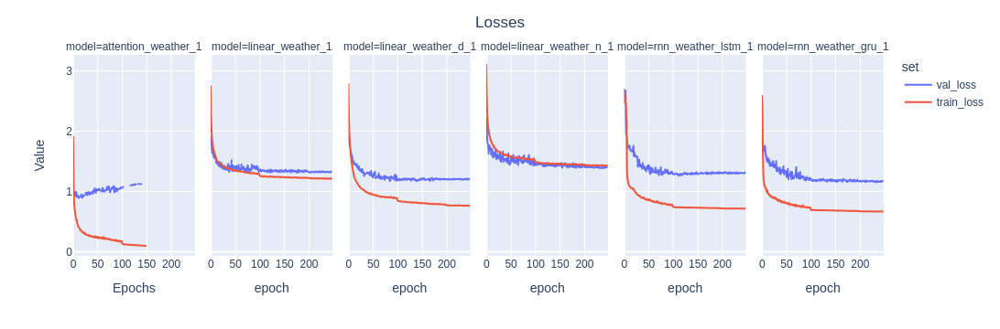

In [1]:
import plotly.express as px
import pandas as pd
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTSTraffic/csv/prova_test_LOSSES.csv')

fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model')
#fig_losses.update_traces(mode="markers+lines", hovertemplate=None)
#fig_losses.update_layout(hovermode="x unified")
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses.show()

In [19]:
import plotly.express as px
import pandas as pd
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)
tot_pred.y_median[tot_pred.model=='d3vae_weather_1'] = tot_pred.y_pred[tot_pred.model=='d3vae_weather_1']
tot_pred.y_median[tot_pred.model=='persistent_weather_1'] = tot_pred.y_pred[tot_pred.model=='persistent_weather_1']

/tmp/ipykernel_11414/2014455174.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_11414/2014455174.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [20]:
tot_pred.head()

,Unnamed: 0,lag,time,y,y_low,y_median,y_high,model,y_pred
0,0,1,2020-10-19 22:00:00,0.743537,0.625159,0.728140,0.865014,linear_weather_d_1,NaN
840720,840720,1,2020-10-19 22:00:00,0.743537,0.606649,0.732974,0.882874,linear_weather_n_1,NaN
1008864,1008864,1,2020-10-19 22:00:00,0.743537,0.549619,0.733829,0.944748,attention_weather_1,NaN
672576,672576,1,2020-10-19 22:00:00,0.743537,0.446850,0.626553,0.822512,rnn_weather_gru_1,NaN
336288,336288,1,2020-10-19 22:00:00,0.743537,NaN,0.503242,NaN,d3vae_weather_1,0.503242


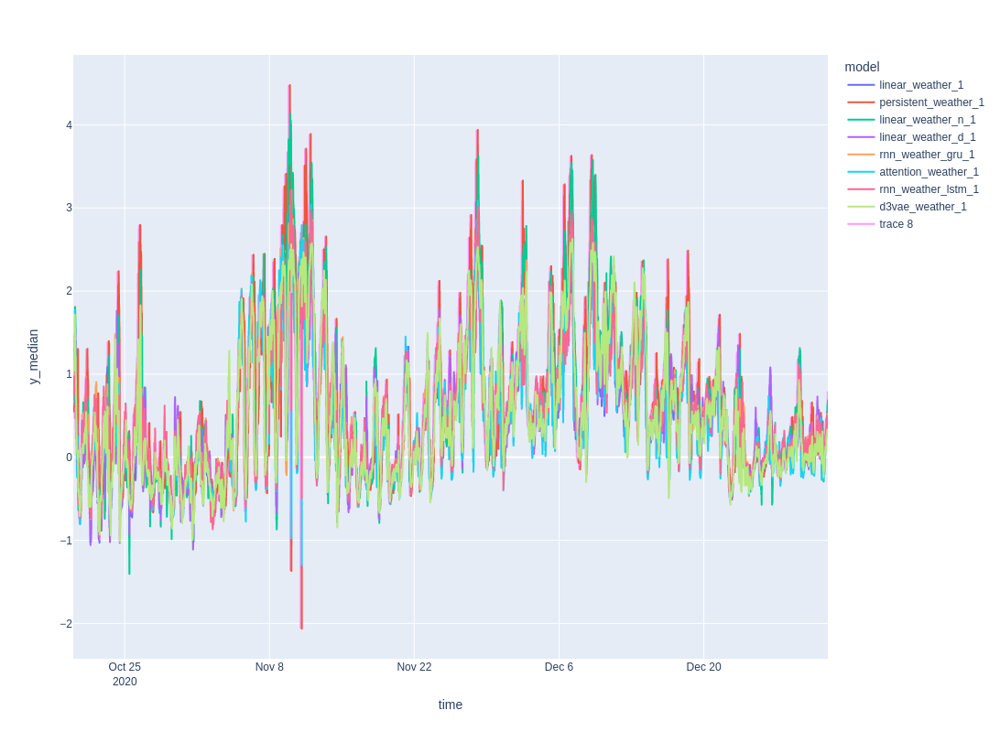

In [21]:
fig = px.line(tot_pred[tot_pred.lag==16], x='time', y='y_median', color='model',height=800)
fig.add_scatter(x = tot_pred[tot_pred.lag==16].time, y=tot_pred[tot_pred.lag==16].y)

In [23]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: np.nanmean((x.y-x.y_median)**2)).reset_index().rename(columns={0:'error'}) 


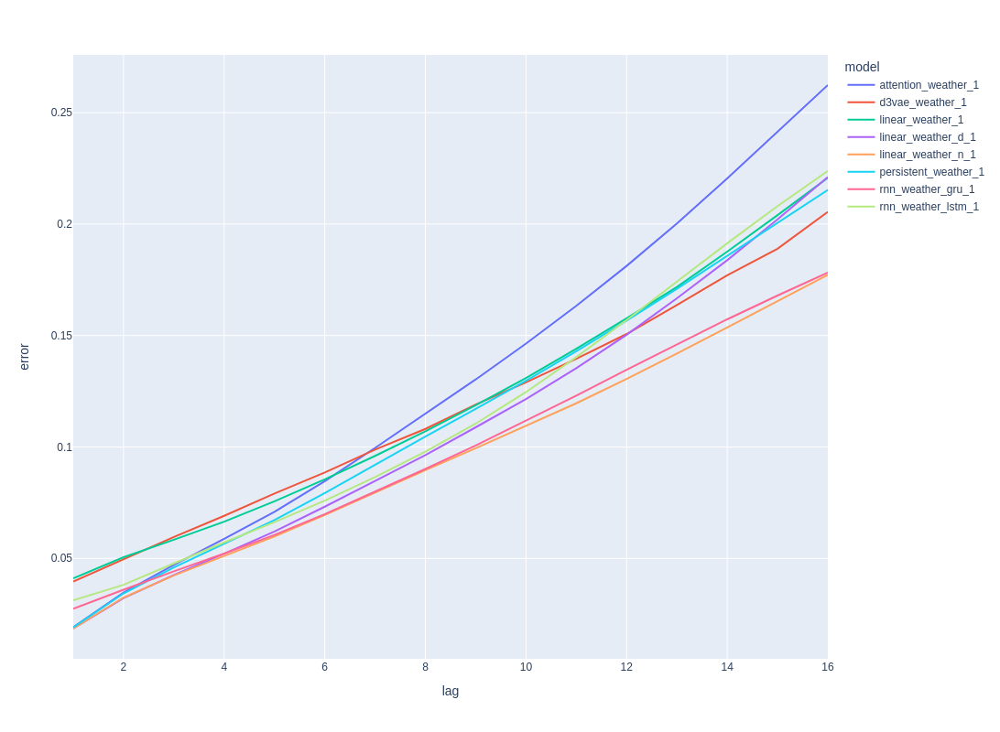

In [26]:
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show()

In [34]:
error[error.model=='rnn_weather_gru_1']

,lag,model,error
5,1,rnn_weather_gru_1,0.406684
12,2,rnn_weather_gru_1,0.397108
19,3,rnn_weather_gru_1,0.386252
26,4,rnn_weather_gru_1,0.373913
33,5,rnn_weather_gru_1,0.362212
40,6,rnn_weather_gru_1,0.349343
47,7,rnn_weather_gru_1,0.335265
54,8,rnn_weather_gru_1,0.323539
61,9,rnn_weather_gru_1,0.316570
68,10,rnn_weather_gru_1,0.314499
